<a href="https://colab.research.google.com/github/yxong1114/fall-detection/blob/main/two_step_fall_detection_v1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### Clone TensorFlow Model

In [ ]:
# Clone Tensorflow model repo
%cd /content
!git clone --quiet https://github.com/tensorflow/models.git
# Compile protocol buffers
%cd /content/models/research
!protoc object_detection/protos/*.proto --python_out=.
!cp object_detection/packages/tf2/setup.py .
# Set environment variables
import os
os.environ['PYTHONPATH'] += ':/content/models:/content/models/research/:/content/models/research/slim/'
# Install libraries
!pip install .
# Test
!python object_detection/builders/model_builder_test.py

/content
/content/models/research
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Processing /content/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.2/14.2 MB 28.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 56.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 28.0/28.0 MB 38.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.6/116.6 kB 12.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 175.1/175.1 kB 20.8 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 73.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/4

2023-05-10 14:37:31.216296: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2023-05-10 14:37:32.336908: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Download Pretrained Model

In [ ]:
%cd /content/models/research

import os
import shutil
import glob
import urllib.request
import tarfile
model_name = 'ssd_mobilenet_v2_320x320_coco17_tpu-8'
MODEL_FILE = model_name + '.tar.gz'
DOWNLOAD_BASE = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/'
DEST_DIR = '/content/models/research/pretrained_model'

if not (os.path.exists(MODEL_FILE)):
    urllib.request.urlretrieve(DOWNLOAD_BASE + MODEL_FILE, MODEL_FILE)

tar = tarfile.open(MODEL_FILE)
tar.extractall()
tar.close()

os.remove(MODEL_FILE)
if (os.path.exists(DEST_DIR)):
    shutil.rmtree(DEST_DIR)
os.rename(model_name, DEST_DIR)

# Check downloaded files
!echo {DEST_DIR}
!ls -alh {DEST_DIR}

# Set fine tune checkpoint
fine_tune_checkpoint = os.path.join(DEST_DIR, "checkpoint/ckpt-0")
print("fine_tune_checkpoint: ", fine_tune_checkpoint)

/content/models/research
/content/models/research/pretrained_model
total 24K
drwxr-x---  4 345018 89939 4.0K Jul 11  2020 .
drwxr-xr-x 25 root   root  4.0K May 10 14:39 ..
drwxr-x---  2 345018 89939 4.0K Jul 10  2020 checkpoint
-rw-r-----  1 345018 89939 4.4K Jul 11  2020 pipeline.config
drwxr-x---  3 345018 89939 4.0K Jul 10  2020 saved_model
fine_tune_checkpoint:  /content/models/research/pretrained_model/checkpoint/ckpt-0


### Clone Project Repo

In [ ]:
%cd /content

# Repo URL
repo_url = 'https://github.com/yxong1114/fall-detection'

!git clone {repo_url}

### Set Images for Inference

In [ ]:
import os

# Use images in test dir (update this if you have other images for inference)
IMAGE_DIR = '/content/fall-detection/images_v2/test/'
IMAGE_PATHS = []

for file in os.listdir(IMAGE_DIR):
    if file.endswith(".jpg") or file.endswith(".png"):
        IMAGE_PATHS.append(os.path.join(IMAGE_DIR, file))

IMAGE_PATHS

['/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (12).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (15).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (16).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (20).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (23).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (24).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (28).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (31).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (32).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (35).png',
 '/content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (36).png',
 '/content

### Load Pretrained Model

In [ ]:
%cd /content

import time
import tensorflow as tf # Added as colab instance often crash
from object_detection.utils import label_map_util
from object_detection.utils import visualization_utils as viz_utils

# Label Map path
PATH_TO_LABELS = '/content/fall-detection/annotations/mscoco_label_map.pbtxt'
# Saved model path
PATH_TO_SAVED_MODEL = '/content/models/research/pretrained_model/saved_model'

print('Loading model...', end='')
start_time = time.time()

# Load saved model and build the detection function
detect_fn = tf.saved_model.load(PATH_TO_SAVED_MODEL)

end_time = time.time()
elapsed_time = end_time - start_time
print('Done! Took {} seconds'.format(elapsed_time))

# Set category index
category_index = label_map_util.create_category_index_from_labelmap(PATH_TO_LABELS,
                                                                    use_display_name=True)

/content
Loading model...Done! Took 17.86557126045227 seconds


### Make Prediction

Running inference for /content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (12).png... Done
Running inference for /content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (15).png... Done
Running inference for /content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (16).png... Done
Running inference for /content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (20).png... Done
Running inference for /content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (23).png... Done
Running inference for /content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (24).png... Done
Running inference for /content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (28).png... Done
Running inference for /content/drive/MyDrive/IntelligentSystems/fall-detection/images_v2/test/fall (31).png... Done
Running inference for /content/drive/MyDrive/IntelligentSystems/fall-det

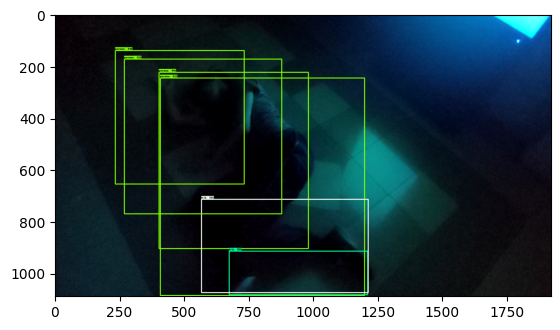

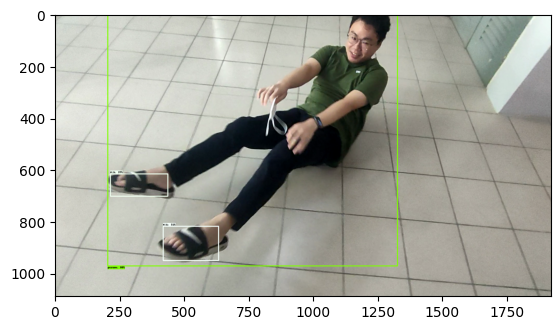

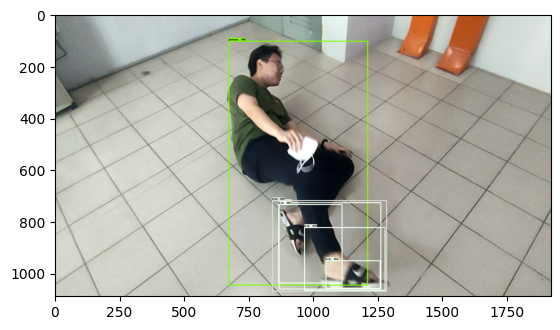

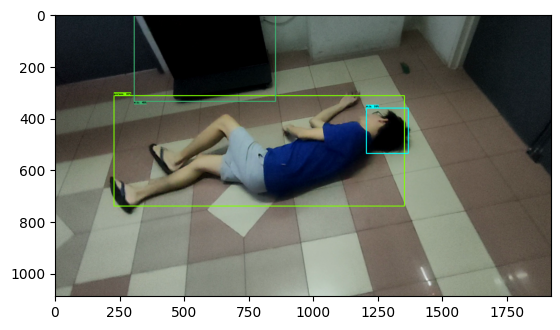

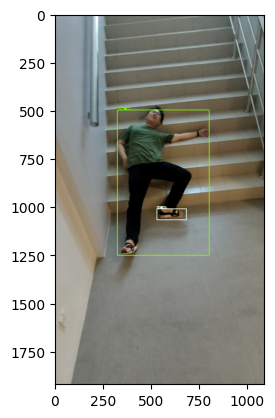

...

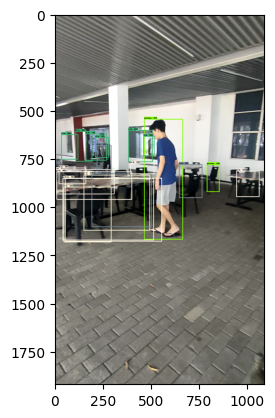

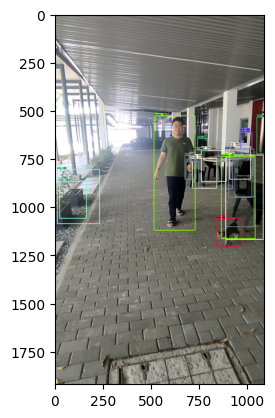

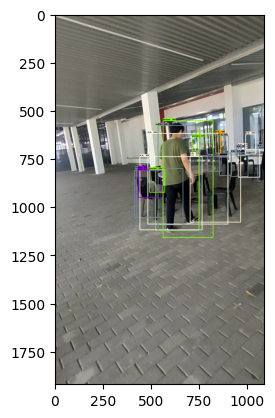

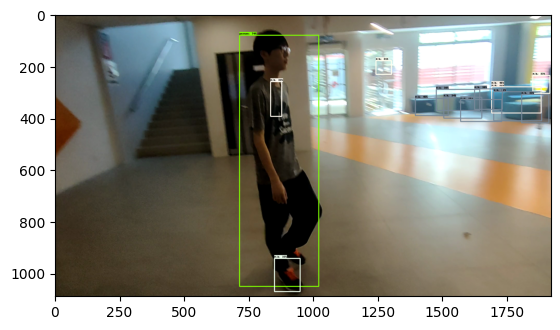

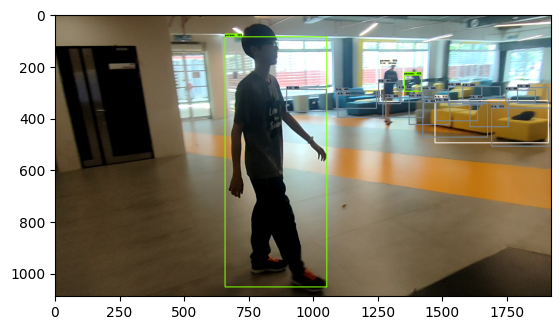

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')   # Suppress Matplotlib warnings
# This is required to display the images.
%matplotlib inline 

for image_path in IMAGE_PATHS:

    print('Running inference for {}... '.format(image_path), end='')

    # Puts image into numpy array to feed into tensorflow graph.
    # Note that by convention we put it into a numpy array with shape
    #   (height, width, channels), where channels=3 for RGB.
    image_np = np.array(Image.open(image_path))

    # The input needs to be a tensor, convert it using `tf.convert_to_tensor`.
    input_tensor = tf.convert_to_tensor(image_np)

    # The model expects a batch of images, so add an axis with `tf.newaxis`.
    input_tensor = input_tensor[tf.newaxis, ...]

    # input_tensor = np.expand_dims(image_np, 0)
    detections = detect_fn(input_tensor)

    # All outputs are batches tensors.
    # Convert to numpy arrays, and take index [0] to remove the batch dimension.
    # We're only interested in the first num_detections.
    num_detections = int(detections.pop('num_detections'))
    detections = {key: value[0, :num_detections].numpy()
                   for key, value in detections.items()}
    detections['num_detections'] = num_detections

    # detection_classes should be ints.
    detections['detection_classes'] = detections['detection_classes'].astype(np.int64)

    image_np_with_detections = image_np.copy()

    viz_utils.visualize_boxes_and_labels_on_image_array(
          image_np_with_detections,
          detections['detection_boxes'],
          detections['detection_classes'],
          detections['detection_scores'],
          category_index,
          use_normalized_coordinates=True,
          max_boxes_to_draw=20,
          min_score_thresh=.30,
          agnostic_mode=False)

    plt.figure()
    plt.imshow(image_np_with_detections)
    print('Done')
plt.show()